## ChexPert Chest X-Ray Training Data Investigation And Pre-Processing

In [50]:
from __future__ import print_function
import pandas as pd
from keras.preprocessing.image import load_img
from tqdm import tqdm_notebook
import numpy as np
import random
import matplotlib.pyplot as plt
from skimage.transform import resize
from skimage import exposure

%matplotlib inline

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

from scipy.ndimage import _ni_support
from scipy.ndimage.filters import convolve1d
from scipy import signal
from IPython.display import display
import seaborn as sns

from PIL import Image
import cv2

## Read the provided CSV file containing information for all training images, generate some more columns with details for each patient, study, and view

In [2]:
dir_ = 'CheXpert-v1.0-small'
df = pd.read_csv(dir_+'/'+'train.csv')
a = df['Path'].str.split("/",expand=True)
df['patient']=a[2].str.replace('patient','').astype(int)
df['study'] = a[3].str.replace('study','').astype(int)
df['view'] = a[4].str.split('_', expand=True)[0].str.replace('view','').astype(int)


## For each X-Ray, count the number of labels present (ignore the uncertain label -1 )

In [3]:
df_mod = df.replace([-1,0], np.nan)
#df_mod = df.replace(0, np.nan)
df_mod['Count'] = df_mod.iloc[:,5:17].count(axis = 1)
df_mod = df_mod.fillna(0)

df['Count'] = df_mod['Count']
df = df.fillna(0)
df.head()

,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,...,Atelectasis,Pneumothorax,Pleural Effusion,Pleural Other,Fracture,Support Devices,patient,study,view,Count
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1,1,1,1
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,0.0,0.0,-1.0,1.0,0.0,...,-1.0,0.0,-1.0,0.0,1.0,0.0,2,2,1,1
2,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Frontal,AP,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,2,1,1,1
3,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Lateral,0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,2,1,2,1
4,CheXpert-v1.0-small/train/patient00003/study1/...,Male,41,Frontal,AP,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3,1,1,1


## Some statistics from the training data

In [4]:
print('Total Number of Patients:', len(df.groupby('patient')))
print('Total Number of X-Rays', len(df))
print('Total Number of Frontal X Rays: ', df.groupby('Frontal/Lateral').size()[0])
print('\t Total Number of Frontal AP X Rays: ', df.groupby('AP/PA').size()['AP'])
print('\t Total Number of Frontal PA X Rays: ', df.groupby('AP/PA').size()['PA'])
print('\t Total Number of Other Non AP/PA Frontal X Rays: ', df.groupby('AP/PA').size().loc[['LL', 'RL']].sum())
print('Total Number of Lateral X Rays: ', df.groupby('Frontal/Lateral').size()[1])

Total Number of Patients: 64540
Total Number of X-Rays 223414
Total Number of Frontal X Rays:  191027
	 Total Number of Frontal AP X Rays:  161590
	 Total Number of Frontal PA X Rays:  29420
	 Total Number of Other Non AP/PA Frontal X Rays:  17
Total Number of Lateral X Rays:  32387


## Many patients have more than one X-ray, plot the distribution

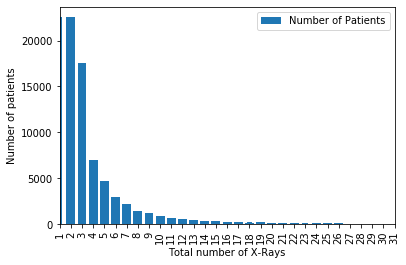

In [5]:
grouped = df.groupby(['patient']).size().reset_index()
grouped.columns = ['patient', 'num_xrays']
grouped2 = grouped.groupby('num_xrays').count().reset_index()
grouped2.columns = ['Total Number of X Rays', 'Number of Patients']

grouped2.plot(x = 'Total Number of X Rays', y = 'Number of Patients', kind = 'bar')
plt.bar(grouped2['Total Number of X Rays'], grouped2['Number of Patients'])
plt.xlim(0,30)
plt.xlabel('Total number of X-Rays')
plt.ylabel('Number of patients')
plt.show()

## Count the number of positive labels for each X Ray

In [6]:
# list all the relevant labels
df.columns[5:17]

Index(['No Finding', 'Enlarged Cardiomediastinum', 'Cardiomegaly',
       'Lung Opacity', 'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia',
       'Atelectasis', 'Pneumothorax', 'Pleural Effusion', 'Pleural Other'],
      dtype='object')

In [7]:
grouped = df.groupby('Count').size().reset_index()
grouped.columns = ['Number of labels', 'XRayCount']
grouped['Percentage'] = (100*grouped['XRayCount']/grouped['XRayCount'].sum()).round(3)
grouped['Number of Patients'] = df.groupby('Count').patient.nunique()
grouped

,Number of labels,XRayCount,Percentage,Number of Patients
0,0,20038,8.969,12404
1,1,83166,37.225,39802
2,2,68169,30.512,28173
3,3,39071,17.488,17538
4,4,11193,5.010,6611
5,5,1616,0.723,1230
6,6,148,0.066,121
7,7,13,0.006,10


## 20038 X-Rays are unlabelled, re-label these with label "No Finding" = 1 in a new column named "NoFinding_Updated"

In [8]:
df['NoFinding_Updated'] = df['No Finding']
df.loc[df['Count'] == 0, 'NoFinding_Updated'] = 1
df.head()

,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,...,Pneumothorax,Pleural Effusion,Pleural Other,Fracture,Support Devices,patient,study,view,Count,NoFinding_Updated
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1,1,1,1,1.0
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,0.0,0.0,-1.0,1.0,0.0,...,0.0,-1.0,0.0,1.0,0.0,2,2,1,1,0.0
2,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Frontal,AP,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,2,1,1,1,0.0
3,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Lateral,0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,2,1,2,1,0.0
4,CheXpert-v1.0-small/train/patient00003/study1/...,Male,41,Frontal,AP,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3,1,1,1,0.0


In [9]:
df.to_csv('training_data_info_modified.csv')

## For each diagnosis label, count the uncertain, negative, and positive labels

In [10]:
list_cols = df.columns[6:17].tolist()
list_cols.append(df.columns[23])
print(list_cols)
indications_df = df[list_cols]

['Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity', 'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia', 'Atelectasis', 'Pneumothorax', 'Pleural Effusion', 'Pleural Other', 'NoFinding_Updated']


In [11]:
count_labels_df = indications_df.apply(lambda x: 100 * x.value_counts()/ x.count())
count_labels_df.rename(index={ -1 : 'Uncertain', 0 : 'Negative', 1 : 'Positive' }, inplace = True)
count_labels_df.fillna(0, inplace = True)

In [12]:
count_labels_df

,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,Edema,Consolidation,Pneumonia,Atelectasis,Pneumothorax,Pleural Effusion,Pleural Other,NoFinding_Updated
Uncertain,5.551577,3.619737,2.505662,0.666028,5.811632,12.417306,8.401443,15.101560,1.407701,5.204687,1.187482,0.000000
Negative,89.615243,84.295076,50.236333,95.222323,70.803083,80.965830,88.895503,69.959358,89.887384,56.218053,97.235625,81.013276
Positive,4.833180,12.085187,47.258005,4.111649,23.385285,6.616864,2.703054,14.939082,8.704916,38.577260,1.576893,18.986724


Text(0, 0.5, 'Perentage of Total X Rays')

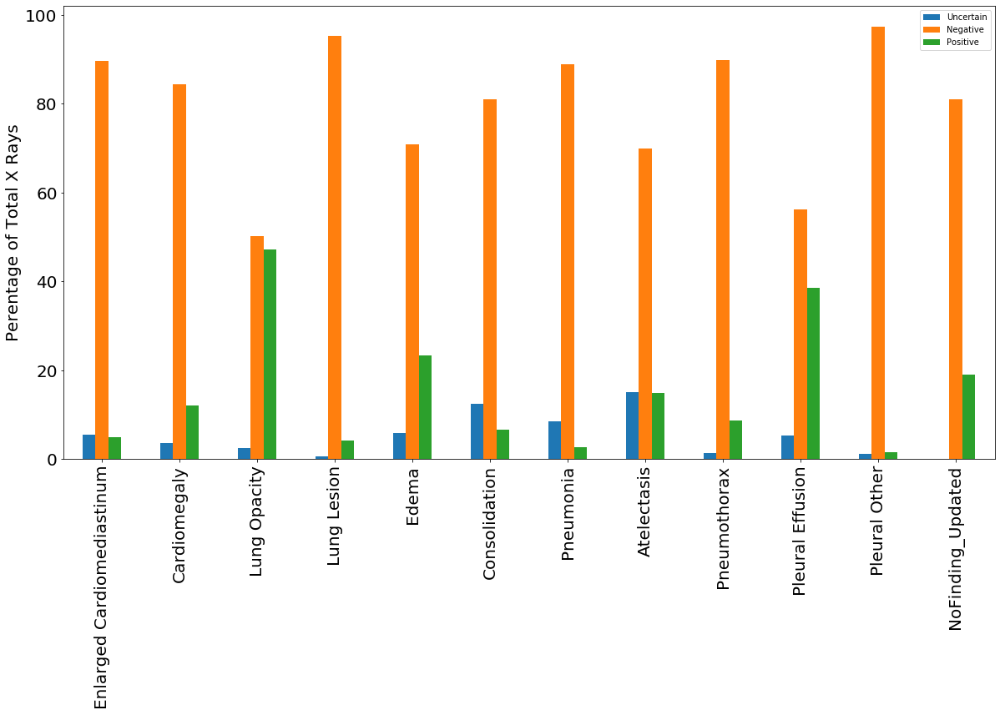

In [13]:
ax = count_labels_df.T.plot(kind = 'bar', figsize = (20,10), fontsize = 20)
ax.set_ylabel("Perentage of Total X Rays", fontsize = 20)

## Generate a cross-correlation heat map of the labels 

/home/varun/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4042: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  method=method)


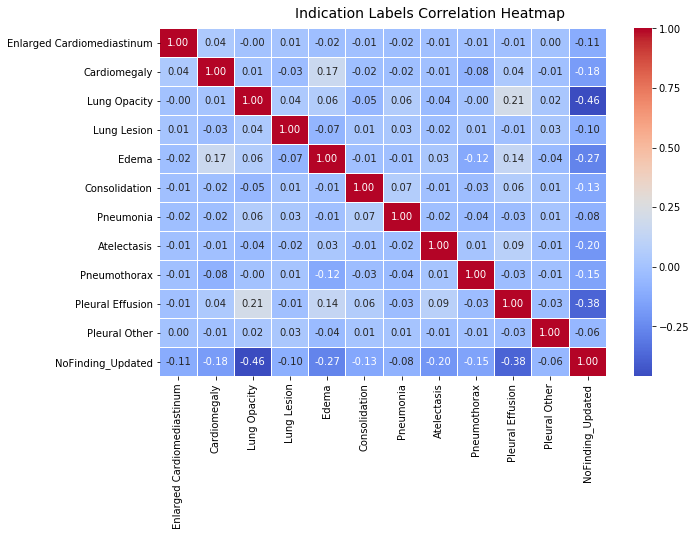

In [14]:
indications_df.replace(-1,0, inplace = True)
f, ax = plt.subplots(figsize=(10, 6))
corr = indications_df.corr()
hm = sns.heatmap(round(corr,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f',
            linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Indication Labels Correlation Heatmap', fontsize=14)

# Looking at some image examples

In [67]:
def display_images_small(df, image_path):
    '''
    Function to display some images from a sample of the data
    '''
    images = [resize(np.array(load_img("{}".format(path), color_mode = "grayscale")), (320,320), anti_aliasing = True, preserve_range = True) for path in tqdm_notebook(df[image_path])]
    titles = np.array(df.iloc[:,[2,4,19,20,21]])
    fig = plt.figure(figsize=(20, 260))  
    for i in range(len(images)):
        sub = fig.add_subplot(40, 5, i + 1)
        sub.set_title('Patient {0} \n Age: {1} \n Study Number: {2} \n View Number: {3}'.format(titles[i][2], titles[i][0], titles[i][3], titles[i][4]), fontsize = 15)
        sub.imshow(images[i], cmap = 'bone')

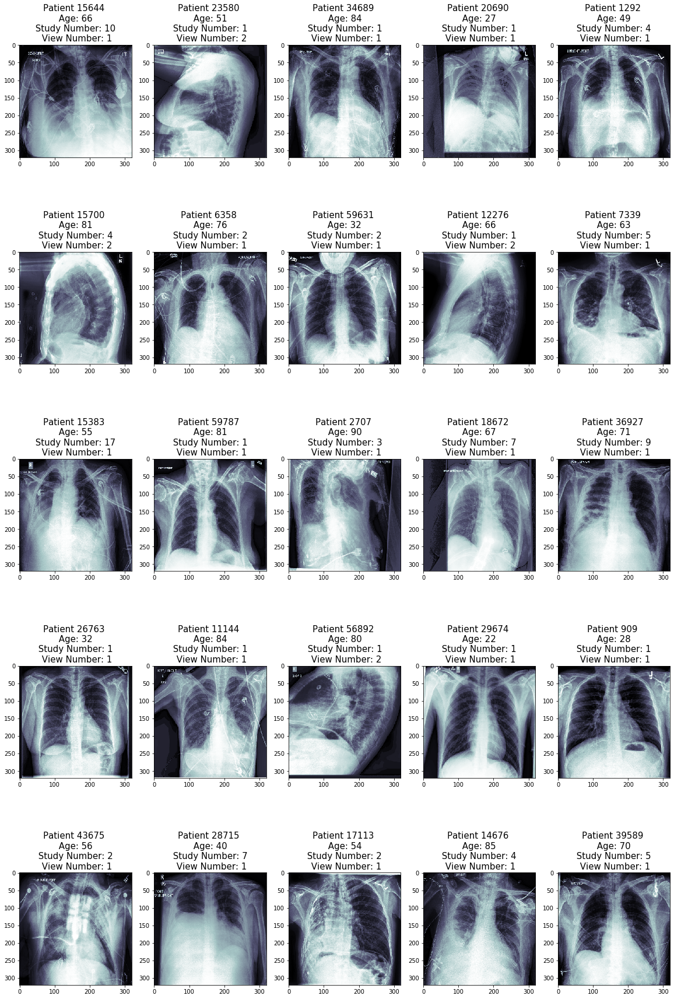

In [68]:
display_images_small(df.sample(25), 'Path')

## Calculate Mean Image

In [19]:
def mean_image(df, batch_size):
    total_number_images = len(df)
    sum_img = np.zeros((320,320))
    total_batches = (total_number_images - 1) // batch_size + 1
    batch = 0
    while batch < total_batches:
        print('Batch #:', batch)
        if batch == total_batches -1:
            end_index = total_number_images
        else:
            end_index = (batch + 1) * batch_size
        images = [np.array(load_img("{}".format(path), color_mode="grayscale")).astype(np.uint8) for path in tqdm_notebook(df['NewPath'].iloc[batch*batch_size:end_index])]
        sum_img_batch = np.sum(images, axis=0)
        sum_img = (sum_img + sum_img_batch)
        del images
        batch += 1
    return sum_img/total_number_images

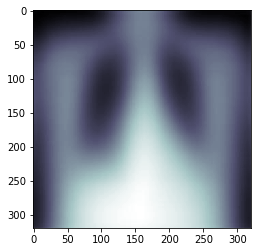

In [28]:
# Select frontal x-ray images only and generate mean image, reading 5000 images per batch at a time


frontal_df = df[df['Frontal/Lateral'] == 'Frontal'].reset_index(drop = True)
#frontal_mean_img = mean_image(frontal_df, 5000)
#Image.fromarray(frontal_mean_img.astype(np.uint8)).save('frontalaverage.jpg')

# Show frontal x-ray mean image
avg_frontal = load_img("frontalaverage.jpg", color_mode="grayscale")
plt.imshow(avg_frontal, cmap='bone')

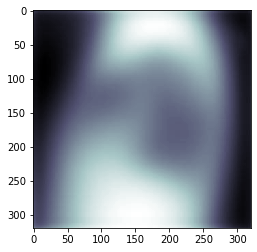

In [21]:
# Show lateral X-ray mean image

avg_lateral = load_img("lateralaverage.jpg", color_mode="grayscale")
plt.imshow(avg_lateral, cmap='bone')

## Function to calculate L1 distance from Mean Image

In [23]:
def distance_from_average(img, average_img):
    image_diff = resize(np.array(img), (320,320), anti_aliasing = True, preserve_range = True) - np.array(average_img)
    return np.sum(np.abs(image_diff))

## Function to find optimal rotated image

In [24]:
def find_optimal_rotated_img(img):
    orig_img = img
    img = Image.fromarray(resize(np.array(img), (320,320), anti_aliasing = True, preserve_range = True))
    rotations = 0
    orig_score =  distance_from_average(img, avg_frontal)
    while rotations < 3 and orig_score > 7000000:
        img = img.rotate(90)
        rotated_score = distance_from_average(img, avg_frontal)
        if 1 - (rotated_score/orig_score) > 0.30:
            return img
        rotations += 1
    return orig_img

## Function to crop low-amplitude edges and resize images to 320x320 pixels

In [25]:
def crop_resize_image(img, tol = 160):
    '''
    Crop images from edges based on intensity tolerance 'tol' by creating masks.
    Output image size is (320,320)
    '''
    orig_img = resize(np.array(img), (320,320), anti_aliasing = True, preserve_range = True)
    dim_x = img.size[0]
    dim_y = img.size[1]
    mask_x = np.zeros(dim_x)
    mask_y = np.zeros(dim_y)
    img = np.array(img).astype(np.uint8)
    initial_mask = (img > tol)
    
    
    mask_x = initial_mask.any(0)
    mask_y = initial_mask.any(1)
    
    min_index = mask_x.tolist().index(True)
    max_index =  dim_x - mask_x.tolist()[::-1].index(True) - 1
    
    # re-adjust masks if the majority (1-fractional_mask) of the x,y arrays have values below tolerance

    fractional_mask = 0.2
    while np.sum(img[:,max_index] > tol) / dim_x < fractional_mask:
        max_index -= 1
    while np.sum(img[:,min_index] > tol) / dim_x < fractional_mask:
        min_index += 1
    
    mask_x[min_index:max_index] = 1
    mask_x[:min_index] = 0
    mask_x[max_index:] = 0

    min_index = mask_y.tolist().index(True)
    max_index =  dim_y - mask_y.tolist()[::-1].index(True) - 1
        
    while np.sum(img[max_index,:] > tol) / dim_y < fractional_mask:
        max_index -= 1
    while np.sum(img[min_index,:] > tol) / dim_y < fractional_mask:
        min_index += 1

    mask_y[min_index:max_index] = 1
    mask_y[:min_index] = 0
    mask_y[max_index:] = 0
    
    cropped_img = resize(np.array(img[np.ix_(mask_y.astype(np.bool).tolist(), mask_x.astype(np.bool).tolist())]), \
                                  (320,320), anti_aliasing = True, preserve_range = True)
    orig_score = distance_from_average(orig_img, avg_frontal)
    cropped_score = distance_from_average(cropped_img, avg_frontal)
    
    canny_input = cropped_img if cropped_score < 1.05 * orig_score else orig_img
    
    blurred = cv2.blur(np.array(canny_input), (11, 11))
    canny = cv2.Canny(np.array(blurred).astype(np.uint8), 100, 100)
    
    ## This logic below could be improved...
    if np.max(canny) > 1:
        pts = np.argwhere(canny>0)
        y1,x1 = pts.min(axis=0)
        y2,x2 = pts.max(axis=0)
 
        cropped2 = np.array(canny_input)[y1:y2, x1:x2]

        if cropped2.size < 2:
            cropped2 = canny_input
        canny_input_score = distance_from_average(canny_input, avg_frontal)
        canny_crop_score = distance_from_average(cropped2, avg_frontal)

        if cropped2.size < 0.5 * canny_input.size or canny_crop_score > 1.05 * canny_input_score:
            cropped2 = canny_input
    else:
        cropped2 = canny_input
    
    return resize(np.array(cropped2), (320,320), anti_aliasing = True, preserve_range = True)

## Create a new Path ('NewPath') to save images, generate unique image ID ('UniqID')

In [29]:
frontal_df['UniqID'] = (frontal_df['study']*100 + frontal_df['view'])*100000 + frontal_df['patient']
dir_ = 'CheXpert_Processed_TrainingData'
batch_size = 5000 # number of images to save in each folder
frontal_df['NewPath'] = dir_ + '/Train_' + (batch_size * (frontal_df.index // batch_size + 1)).astype(str) + \
    '/' + frontal_df['UniqID'].astype(str) + '.jpg'

In [31]:
frontal_df.head()

,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,...,Pleural Other,Fracture,Support Devices,patient,study,view,Count,NoFinding_Updated,UniqID,NewPath
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1,1,1,1,1.0,10100001,CheXpert_Processed_TrainingData/Train_5000/101...
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,0.0,0.0,-1.0,1.0,0.0,...,0.0,1.0,0.0,2,2,1,1,0.0,20100002,CheXpert_Processed_TrainingData/Train_5000/201...
2,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Frontal,AP,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,2,1,1,1,0.0,10100002,CheXpert_Processed_TrainingData/Train_5000/101...
3,CheXpert-v1.0-small/train/patient00003/study1/...,Male,41,Frontal,AP,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3,1,1,1,0.0,10100003,CheXpert_Processed_TrainingData/Train_5000/101...
4,CheXpert-v1.0-small/train/patient00004/study1/...,Female,20,Frontal,PA,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,4,1,1,1,1.0,10100004,CheXpert_Processed_TrainingData/Train_5000/101...


## Function to save rotated + cropped  + resized images

In [ ]:
def save_cropped_images(df, batch_size):
    '''
    Save cropped images in file locations specified by 'NewPath' field in the dataframe
    '''
    
    total_number_images = len(df)
    total_batches = (total_number_images - 1) // batch_size + 1
    batch = 0
    dir_ = 'CheXpert_Processed_TrainingData'
    dir_num = batch_size
    
    while batch < total_batches:
        print('Batch #:', batch)
        if batch == total_batches -1:
            end_index = total_number_images
        else:
            end_index = (batch + 1) * batch_size
        
        new_path = dir_ + '/Train_' + str(dir_num)
        
        # create directories per batch
        try:  
            os.mkdir(new_path)
        except OSError:  
            print ("Creation of the directory %s failed" % new_path)
        else:  
            print ("Successfully created the directory %s " % new_path)
        
        # read in images in batches and apply rotate/crop function
        images = [crop_resize_image(find_optimal_rotated_img(load_img("{}".format(path), color_mode = "grayscale"))) \
                  for path in tqdm_notebook(df['Path'].iloc[batch * batch_size:end_index])]
        save_path = [new_path for new_path in tqdm_notebook(df['NewPath'].iloc[batch * batch_size:end_index])]
        
        # save cropped images to new path:
        [Image.fromarray(np.array(images[idx]).astype(np.uint8)).save(save_path[idx]) \
         for idx, val in enumerate(save_path)]
        
        del images
        batch += 1
        dir_num += batch_size

In [32]:
# Run the rotate + crop + resize on all frontal images (commented out since it was run previously)

#save_cropped_images(frontal_df, batch_size)

## Display some examples of original vs cropped images

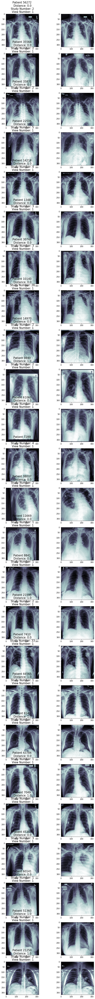

In [65]:
sample_df = frontal_df.sample(25)
images_orig = [resize(np.array(load_img("{}".format(path), color_mode = "grayscale")), (320,320), anti_aliasing = True, preserve_range = True) for path in tqdm_notebook(sample_df['Path'])]
images_new = [np.array(load_img("{}".format(path), color_mode = "grayscale")) for path in tqdm_notebook(sample_df['NewPath'])]

titles = np.array(sample_df.iloc[:,[2,4,19,20,21,23]])
fig = plt.figure(figsize=(10, 200))  
for i in range(len(images_new)):
    sub = fig.add_subplot(50, 2, i*2 + 1)
    sub.set_title('Patient {0} \n Distance: {1} \n Study Number: {2} \n View Number: {3}'.format(titles[i][2], titles[i][5], titles[i][3], titles[i][4]), fontsize = 15)
    sub.imshow(images_orig[i], cmap = 'bone')
    sub = fig.add_subplot(50, 2, i*2 + 2)
    sub.imshow(images_new[i], cmap = 'bone')

## Function to generate L1 distance for all images

In [33]:
def create_distances(df, average_img, batch_size):
    total_number_images = len(df)
    distances_orig = []
    distances_cropped = []
    total_batches = (total_number_images - 1) // batch_size + 1
    batch = 0
    while batch < total_batches:
        print('Batch #:', batch)
        if batch == total_batches -1:
            end_index = total_number_images
        else:
            end_index = (batch + 1) * batch_size
            
        images_cropped = [np.array(load_img("{}".format(path), color_mode = "grayscale")) \
                        for path in tqdm_notebook(df['NewPath'].iloc[batch*batch_size:end_index])]
        
        distances_cropped.extend([distance_from_average(img, average_img) for img in images_cropped])
        
        images_orig = [np.array(load_img("{}".format(path), color_mode = "grayscale")) \
                        for path in tqdm_notebook(df['Path'].iloc[batch*batch_size:end_index])]
        
        distances_orig.extend([distance_from_average(img, average_img) for img in images_orig])
        
        #df['DistanceRotatedCropped'] = distances_cropped
        #df['DistanceOrig'] = distances_orig
        del images_cropped, images_orig
        batch += 1
    df['DistanceRotatedCropped'] = distances_cropped
    df['DistanceOrig'] = distances_orig

In [34]:
# Distances for each image calculated previously
#create_distances(frontal_df, avg_frontal, 5000)

In [35]:
# Read in previously calculated L1 distances
frontal_df2 = pd.read_csv('frontal_images_distance_score2.csv').iloc[:,1:]
frontal_df2.head()

,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,...,Fracture,Support Devices,patient,study,view,Count,UniqID,NewPath,DistanceRotatedCropped,DistanceOrig
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1,1,1,2,10100001,CheXpert_Processed_TrainingData/Train_5000/101...,3942244.0,3.956291e+06
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,0.0,0.0,-1.0,1.0,0.0,...,1.0,0.0,2,2,1,2,20100002,CheXpert_Processed_TrainingData/Train_5000/201...,4294154.0,4.299424e+06
2,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Frontal,AP,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,2,1,1,2,10100002,CheXpert_Processed_TrainingData/Train_5000/101...,5391974.0,8.223708e+06
3,CheXpert-v1.0-small/train/patient00003/study1/...,Male,41,Frontal,AP,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3,1,1,1,10100003,CheXpert_Processed_TrainingData/Train_5000/101...,4485845.0,4.188360e+06
4,CheXpert-v1.0-small/train/patient00004/study1/...,Female,20,Frontal,PA,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,4,1,1,1,10100004,CheXpert_Processed_TrainingData/Train_5000/101...,4931569.0,5.217631e+06


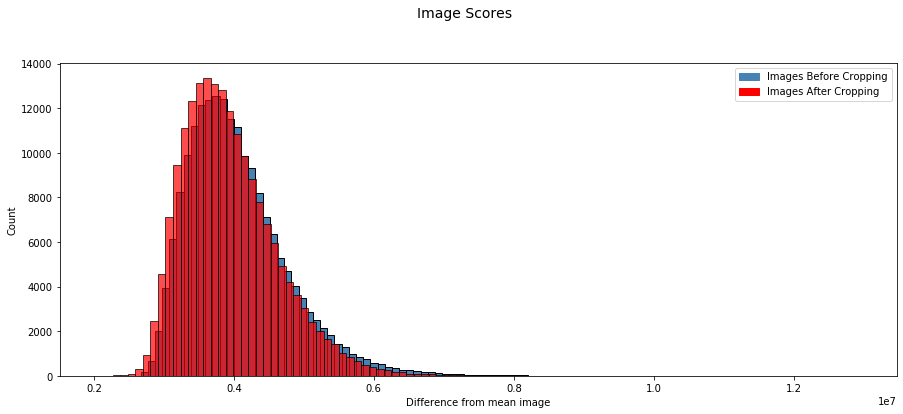

In [38]:
import matplotlib.patches as mpatches
fig = plt.figure(figsize = (15, 6))
title = fig.suptitle("Image Scores", fontsize=14)
fig.subplots_adjust(top=0.85, wspace=0.3)
ax = fig.add_subplot(1,1, 1)
ax.set_xlabel("Difference from mean image")
ax.set_ylabel("Count") 



freq, bins, patches = ax.hist(frontal_df2['DistanceOrig'], color='steelblue', bins=101,
                                    edgecolor='black', linewidth=1)
freq, bins, patches = ax.hist(frontal_df2['DistanceRotatedCropped'], color='red', bins=101,
                                    edgecolor='black', linewidth=1, alpha = 0.7)
red_patch = mpatches.Patch(color='red', label='Images After Cropping')
blue_patch = mpatches.Patch(color='steelblue', label='Images Before Cropping')
ax.legend(handles = [blue_patch, red_patch])

## Calculate Structural Similarity (SSIM) score for all images compared to mean image

In [39]:
from skimage.measure import compare_ssim as ssim

def calc_ssim(img, average_img):
    img_resize = resize(np.array(img), (320,320), anti_aliasing=True, preserve_range=True).astype(np.uint8)
    return ssim(img_resize, np.array(average_img).astype(np.uint8))


def create_distances_ssim(df, average_img, batch_size):
    total_number_images = len(df)
    #ssim_orig = []
    ssim_cropped = []
    total_batches = (total_number_images - 1) // batch_size + 1
    batch = 0
    while batch < total_batches:
        print('Batch #:', batch)
        if batch == total_batches -1:
            end_index = total_number_images
        else:
            end_index = (batch + 1) * batch_size
            
        images_cropped = [np.array(load_img("{}".format(path), color_mode="grayscale")) \
                        for path in tqdm_notebook(df['NewPath'].iloc[batch*batch_size:end_index])]
        
        ssim_cropped.extend([calc_ssim(img, average_img) for img in images_cropped])
 
        del images_cropped
        batch += 1
    df['SSIMRotatedCropped'] = ssim_cropped


In [40]:
#create_distances_ssim(frontal_df2, avg_frontal, 5000)

#frontal_df2.to_csv('frontal_images_distance_score3.csv')
frontal_df3 = pd.read_csv('frontal_images_distance_score3.csv').iloc[:,1:]
frontal_df3.head()

,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,...,Support Devices,patient,study,view,Count,UniqID,NewPath,DistanceRotatedCropped,DistanceOrig,SSIMRotatedCropped
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,0.0,0.0,0.0,0.0,...,1.0,1,1,1,2,10100001,CheXpert_Processed_TrainingData/Train_5000/101...,3942244.0,3.956291e+06,0.436019
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,0.0,0.0,-1.0,1.0,0.0,...,0.0,2,2,1,2,20100002,CheXpert_Processed_TrainingData/Train_5000/201...,4294154.0,4.299424e+06,0.385993
2,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Frontal,AP,0.0,0.0,0.0,1.0,0.0,...,0.0,2,1,1,2,10100002,CheXpert_Processed_TrainingData/Train_5000/101...,5391974.0,8.223708e+06,0.562898
3,CheXpert-v1.0-small/train/patient00003/study1/...,Male,41,Frontal,AP,0.0,0.0,0.0,0.0,0.0,...,0.0,3,1,1,1,10100003,CheXpert_Processed_TrainingData/Train_5000/101...,4485845.0,4.188360e+06,0.560374
4,CheXpert-v1.0-small/train/patient00004/study1/...,Female,20,Frontal,PA,1.0,0.0,0.0,0.0,0.0,...,0.0,4,1,1,1,10100004,CheXpert_Processed_TrainingData/Train_5000/101...,4931569.0,5.217631e+06,0.325224


In [42]:
def display_images_small(df):
    '''
    Function to display some images from a sample of the data
    '''
    images = [resize(np.array(load_img("{}".format(path), color_mode = "grayscale")), (320,320), anti_aliasing = True, preserve_range = True) for path in tqdm_notebook(df['NewPath'])]
    titles = np.array(df.iloc[:,[2,4,19,20,21,27, 26]])
    fig = plt.figure(figsize=(20, 260))  
    for i in range(len(images)):
        sub = fig.add_subplot(40, 5, i + 1)
        sub.set_title('Patient {0} \n SSIM: {1} \n Distance: {2} \n Study Number: {3} \n View Number: {4}'.format(titles[i][2], titles[i][5], titles[i][6], titles[i][3], titles[i][4]), fontsize = 15)
        sub.imshow(images[i], cmap = 'bone')

## Show examples of images with large L1 distance 

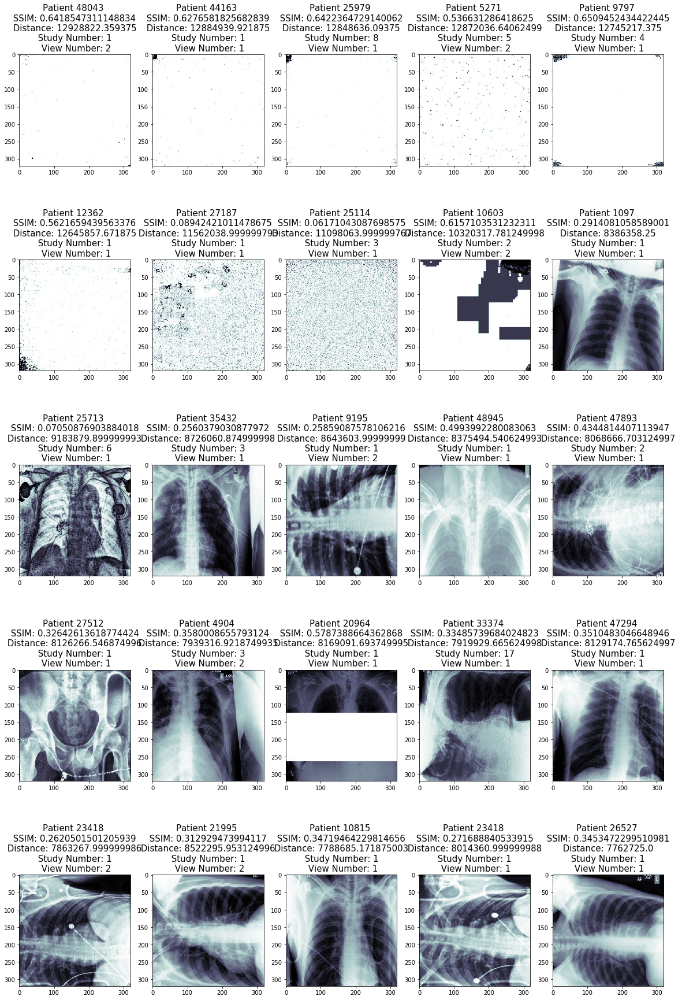

In [64]:
bad_images_df = frontal_df3.sort_values(by='DistanceRotatedCropped', ascending=False).iloc[0:25]
bad_images_df.head()
display_images_small(bad_images_df)

## Show examples of images with low SSIM score 

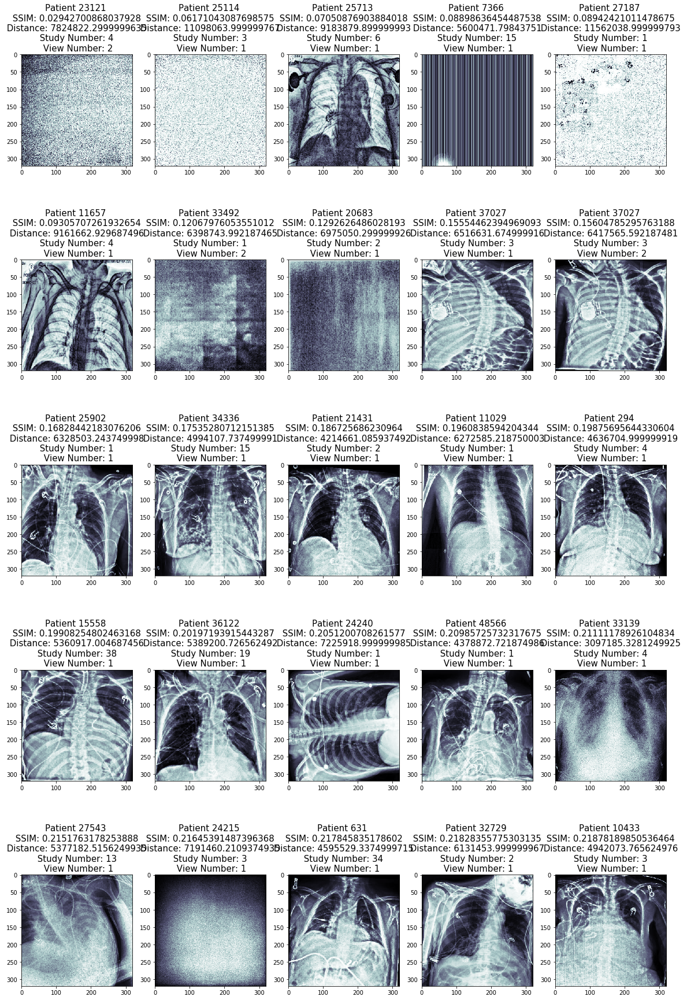

In [63]:
bad_images_df = frontal_df3.sort_values(by = 'SSIMRotatedCropped').iloc[0:25]
bad_images_df.head()
display_images_small(bad_images_df)

## Examine corrupt images with discontinuities using Sobel filter, single example shown

CheXpert_Processed_TrainingData/Train_185000/70158483.jpg


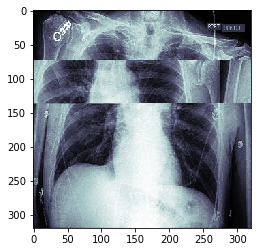

In [48]:
test_df = frontal_df2[(frontal_df2['patient'] == 58483) & (frontal_df2['study'] == 7) & (frontal_df2['view'] == 1)]
test_path = test_df['NewPath'].iloc[0]
print(test_path)
test_img = load_img(test_path, color_mode = "grayscale")
plt.imshow(test_img, cmap = 'bone')

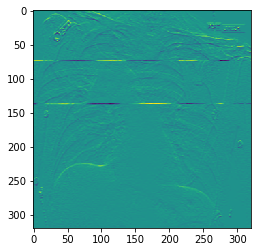

In [51]:
# Apply sobel filter to highlight change in gradient
sobely = cv2.Sobel(np.array(test_img), cv2.CV_64F, 0,1,ksize=3)
plt.imshow(sobely)

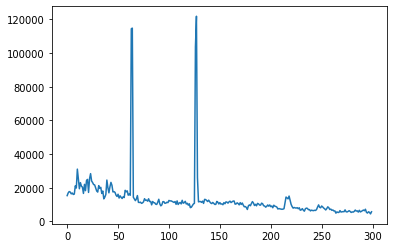

In [52]:
# sum/stack the gradient in the horizontal direction, plot the stack trace profile
stack_trace = [np.sum(np.abs(sobely[idx,:])) for idx in range(10,310)]
plt.plot(stack_trace)

## Use the above approach to generate max gradient values for all images

In [53]:
def find_offset_images(df):
    total_number_images = len(df)
    stack_value = []
    total_batches = (total_number_images - 1) // batch_size + 1
    batch = 0
    while batch < total_batches:
        print('Batch #:', batch)
        if batch == total_batches -1:
            end_index = total_number_images
        else:
            end_index = (batch + 1) * batch_size
            
        images_sobel = [cv2.Sobel(np.array(load_img("{}".format(path), color_mode = "grayscale")), cv2.CV_64F, 0,1,ksize=3) \
                          for path in tqdm_notebook(df['NewPath'].iloc[batch*batch_size:end_index])]
        stack_value.extend([np.max([np.sum(np.abs(sobely[idx,:])) for idx in range(50,270)]) for sobely in images_sobel])
        del images_sobel
        batch += 1
    df['StackValue'] = stack_value

In [54]:
#find_offset_images(frontal_df3)

#frontal_df3.to_csv('frontal_images_distance_score4.csv', sep=',')
frontal_df4 = pd.read_csv('frontal_images_distance_score4.csv').iloc[:,1:]

## Display images that have large gradient values

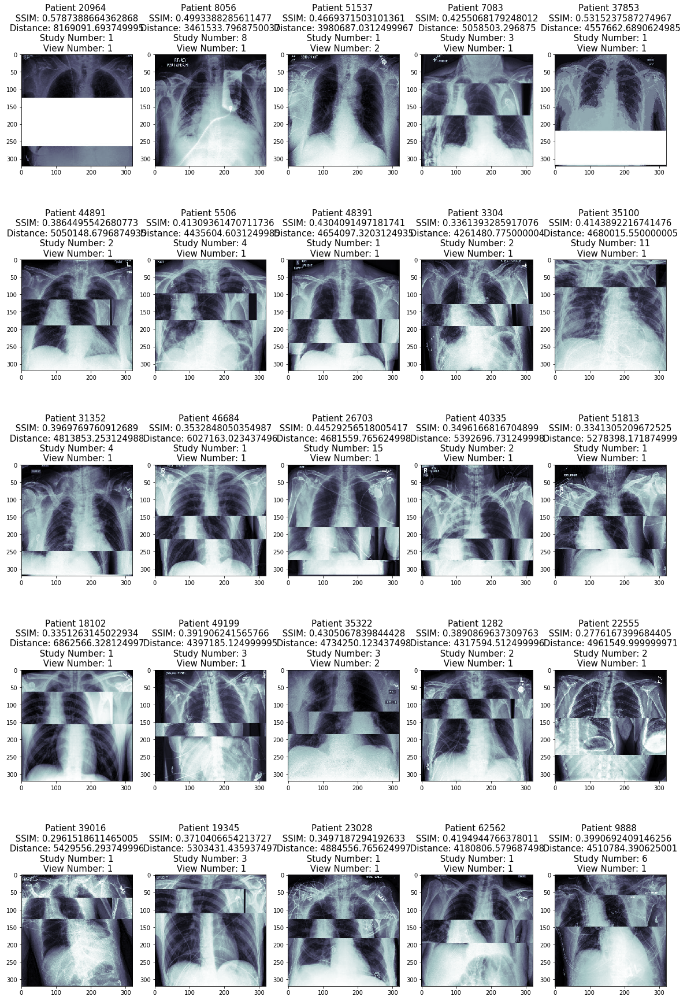

In [62]:
bad_images_df = frontal_df4.sort_values(by='StackValue', ascending=False).iloc[0:25]
bad_images_df.head()
display_images_small(bad_images_df)

## Use picked thresholds for (SSIM + L1 distance + Summed Gradient) to generate a list of images to be discarded from the training set, display some examples of thrown away images

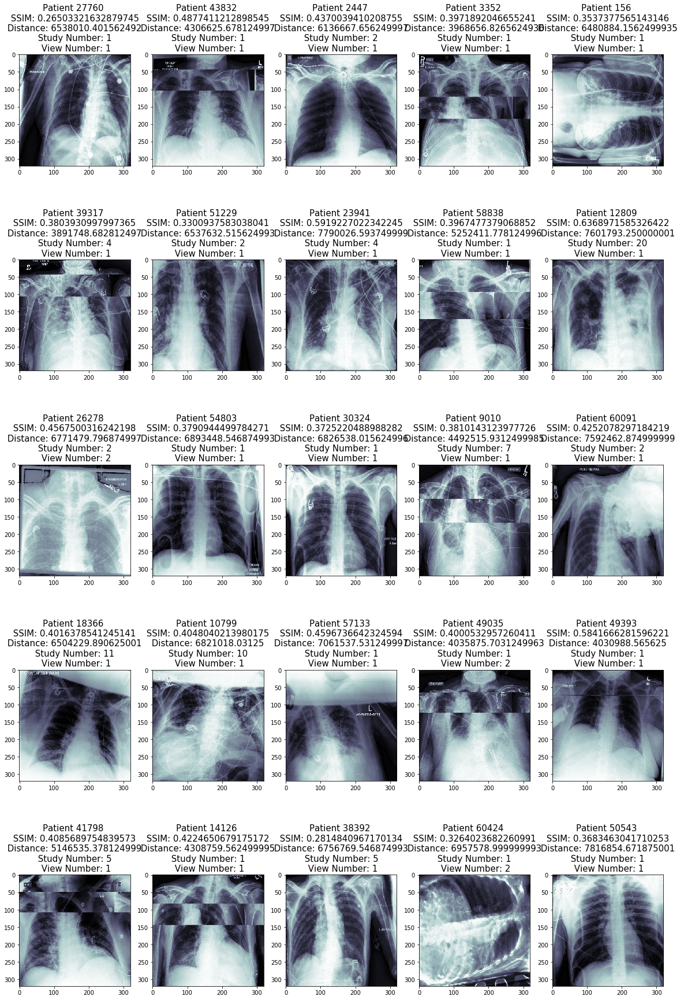

In [61]:
discarded_df = frontal_df4[(frontal_df4['StackValue'] > 50000)\
           | (frontal_df4['DistanceRotatedCropped'] > 6500000) \
           | (frontal_df4['SSIMRotatedCropped'] < 0.27)] #.reset_index(drop = True)
display_images_small(discarded_df.sample(25))

In [58]:
# Using these thresholds, 953 X-ray images (out of 191027) are to be discarded
len(discarded_df)

953

## Create a "Discard" flag based on these thresholds

In [60]:
frontal_df4['DiscardFlag'] = 0
frontal_df4.loc[(frontal_df4['StackValue'] > 50000)\
           | (frontal_df4['DistanceRotatedCropped'] > 6500000) \
           | (frontal_df4['SSIMRotatedCropped'] < 0.27), 'DiscardFlag'] = 1

#frontal_df4.to_csv('frontal_images_distance_score5.csv', sep=',')
frontal_df5 = pd.read_csv('frontal_images_distance_score5.csv').iloc[:,1:]
frontal_df5.head()

,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,...,view,Count,UniqID,NewPath,DistanceRotatedCropped,DistanceOrig,SSIMRotatedCropped,StackValue,DiscardFlag,NoFinding_Updated
0,CheXpert-v1.0-small/train/patient00001/study1/...,Female,68,Frontal,AP,1.0,0.0,0.0,0.0,0.0,...,1,1,10100001,CheXpert_Processed_TrainingData/Train_5000/101...,3942244.0,3.956291e+06,0.436019,12259.0,0,1.0
1,CheXpert-v1.0-small/train/patient00002/study2/...,Female,87,Frontal,AP,0.0,0.0,-1.0,1.0,0.0,...,1,1,20100002,CheXpert_Processed_TrainingData/Train_5000/201...,4294154.0,4.299424e+06,0.385993,14391.0,0,0.0
2,CheXpert-v1.0-small/train/patient00002/study1/...,Female,83,Frontal,AP,0.0,0.0,0.0,1.0,0.0,...,1,1,10100002,CheXpert_Processed_TrainingData/Train_5000/101...,5391974.0,8.223708e+06,0.562898,7989.0,0,0.0
3,CheXpert-v1.0-small/train/patient00003/study1/...,Male,41,Frontal,AP,0.0,0.0,0.0,0.0,0.0,...,1,1,10100003,CheXpert_Processed_TrainingData/Train_5000/101...,4485845.0,4.188360e+06,0.560374,9882.0,0,0.0
4,CheXpert-v1.0-small/train/patient00004/study1/...,Female,20,Frontal,PA,1.0,0.0,0.0,0.0,0.0,...,1,1,10100004,CheXpert_Processed_TrainingData/Train_5000/101...,4931569.0,5.217631e+06,0.325224,22341.0,0,1.0
